# 測試 easyocr 的效果

!pip install easyocr

In [78]:
from PIL import ImageFont, ImageDraw

# Draw bounding boxes and texts
fontpath = "../NotoSansTC-Regular.otf"
def draw_box_text(image, bounds, width=2):
    draw = ImageDraw.Draw(image)
    for bound in bounds:
        text_size = int(min(im.size)/40)
        font = ImageFont.truetype(fontpath, text_size)
        p0, p1, p2, p3 = bound[0]
        x = min([p[0] for p in bound[0]])
        y = max([p[1] for p in bound[0]])
        text = bound[1]
        score = bound[2]
        draw.text((x,y),text,(255,0,255),font=font)
        draw.line([*p0, *p1, *p2, *p3, *p0], fill=(255,255,0), width=width)
    return image

# Draw bounding boxes
def draw_box(image, bounds, color='yellow', width=2):
    draw = ImageDraw.Draw(image)
    for bound in bounds:
        p0, p1, p2, p3 = bound[0]
        draw.line([*p0, *p1, *p2, *p3, *p0], fill=color, width=width)
    return image

#draw_box(im, bounds)
#draw_box_text(im, bounds)

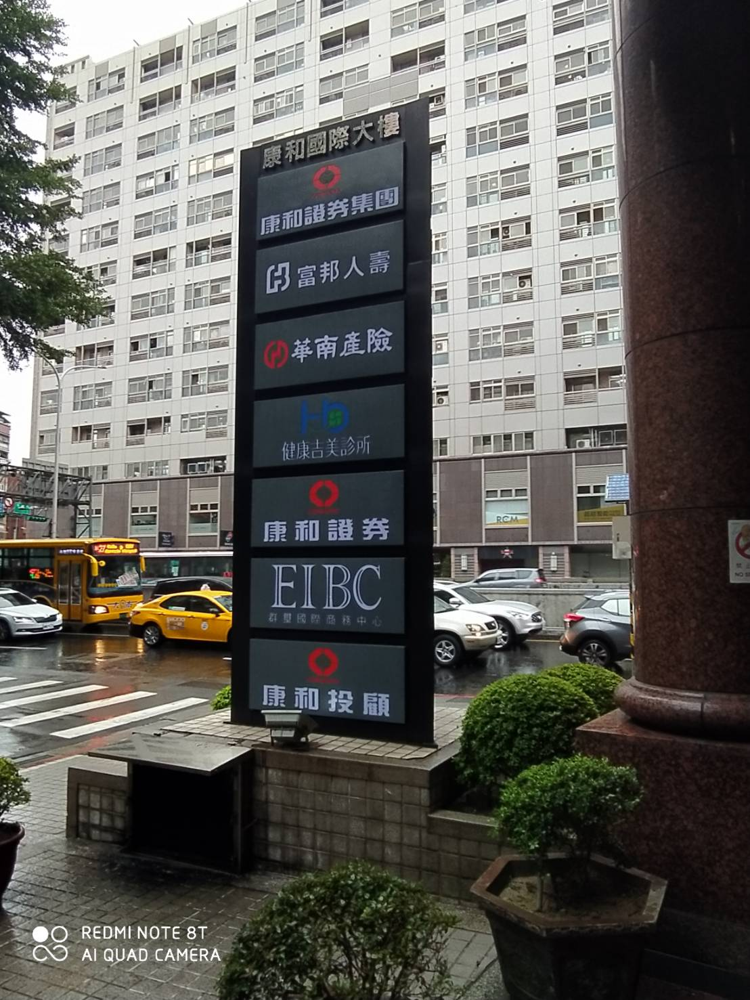

In [72]:
# show an image
import PIL
from PIL import ImageDraw
imgpath = "../testdata/photooriginal-2060291-Rh3tV.jpg"
im = PIL.Image.open(imgpath)
im

In [21]:
# Create a reader to do OCR.
# If you change to GPU instance, it will be faster. But CPU is enough.
# (by MENU > Runtime > Change runtime type > GPU, then redo from beginning )
import easyocr
reader_ce = easyocr.Reader(['ch_tra','en'])  #'ch_sim'
reader_e = easyocr.Reader(['en'])  #'ch_sim'
reader_c = easyocr.Reader(['ch_tra'])  #'ch_sim'

Progress: |██████████████████████████████████████████████████| 100.0% Complete

In [32]:
easyocr.__version__

'1.5.0'

In [73]:
# Doing OCR. Get bounding boxes.
imgpath = "../testdata/photooriginal-2060291-Rh3tV.jpg"
#im = PIL.Image.open(imgpath)
bounds = reader.readtext(imgpath)  #readtext、detect、recognize
bounds

[([[436, 588], [514, 588], [514, 642], [436, 642]], '', 0.0),
 ([[405, 632], [558, 632], [558, 689], [405, 689]],
  '健康古美診所',
  0.22117428419604024),
 ([[731, 759], [769, 759], [769, 773], [731, 773]], '2', 0.0972987264414229),
 ([[383, 755], [580, 755], [580, 808], [383, 808]],
  '康和證券',
  0.9730847477912903),
 ([[389, 825], [577, 825], [577, 913], [389, 913]],
  'EIBC',
  0.7892898321151733),
 ([[391, 897], [568, 897], [568, 930], [391, 930]],
  'n1Dw面私中心',
  3.682199198663193e-05),
 ([[379, 1001], [584, 1001], [584, 1065], [379, 1065]],
  '東和投顧',
  0.084207683801651),
 ([[116, 1362], [312, 1362], [312, 1392], [116, 1392]],
  'REDMI NOTE 8T',
  0.7068735931628073),
 ([[118, 1396], [330, 1396], [330, 1426], [118, 1426]],
  'Al QUAD CAMERA',
  0.5286072875856577),
 ([[369.96396323602215, 208.56035955962435],
   [593.4033098181875, 156.39150560501295],
   [603.0360367639779, 206.43964044037565],
   [379.5966901818125, 259.6084943949871]],
  '康和國際大樓',
  0.3334655472250257),
 ([[371.28352

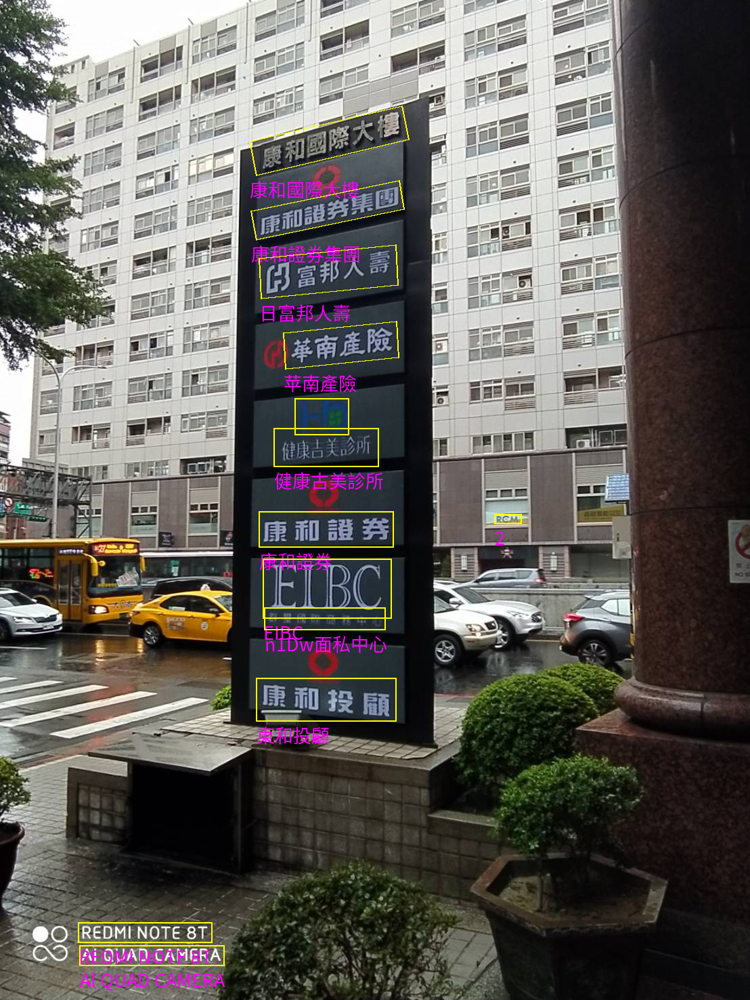

In [79]:
im = PIL.Image.open(imgpath)
draw_box_text(im, bounds)

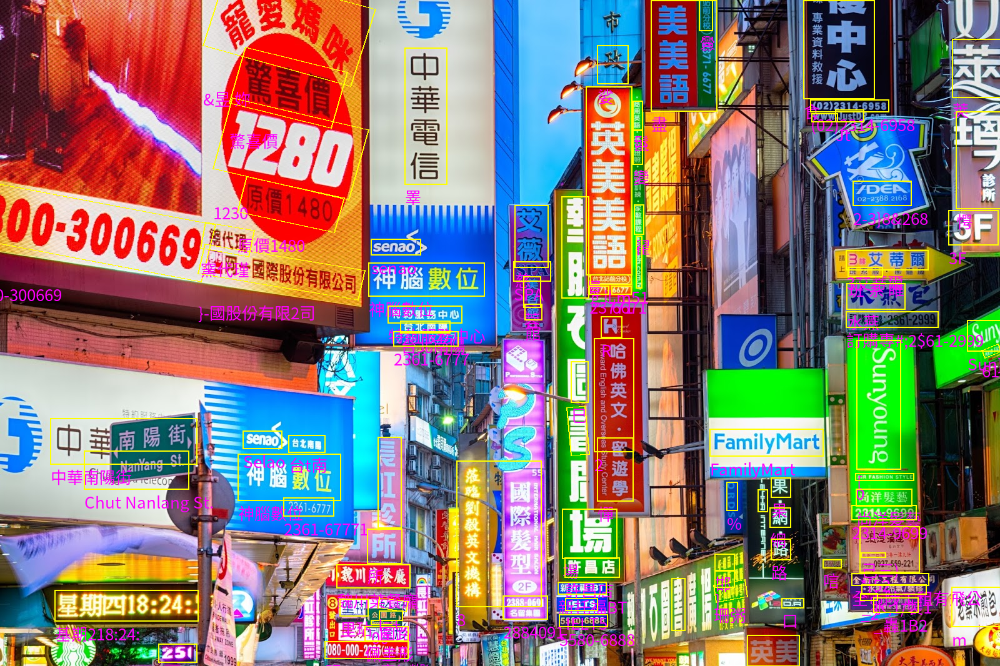

In [85]:
imgpath = "../testdata/1.jpg"
bounds = reader_ce.readtext(imgpath)
#bounds
im = PIL.Image.open(imgpath)
#draw_box(im, bounds)
draw_box_text(im, bounds)

In [83]:
imgpath = "../testdata/starb.jpg_1140x855.jpg"
bounds = reader_e.readtext(imgpath)
bounds

[([[197, 222], [655, 222], [655, 455], [197, 455]],
  'Garaa',
  0.07137910429742507),
 ([[260, 540], [592, 540], [592, 676], [260, 676]],
  'CoffeY',
  0.1560394806491421)]

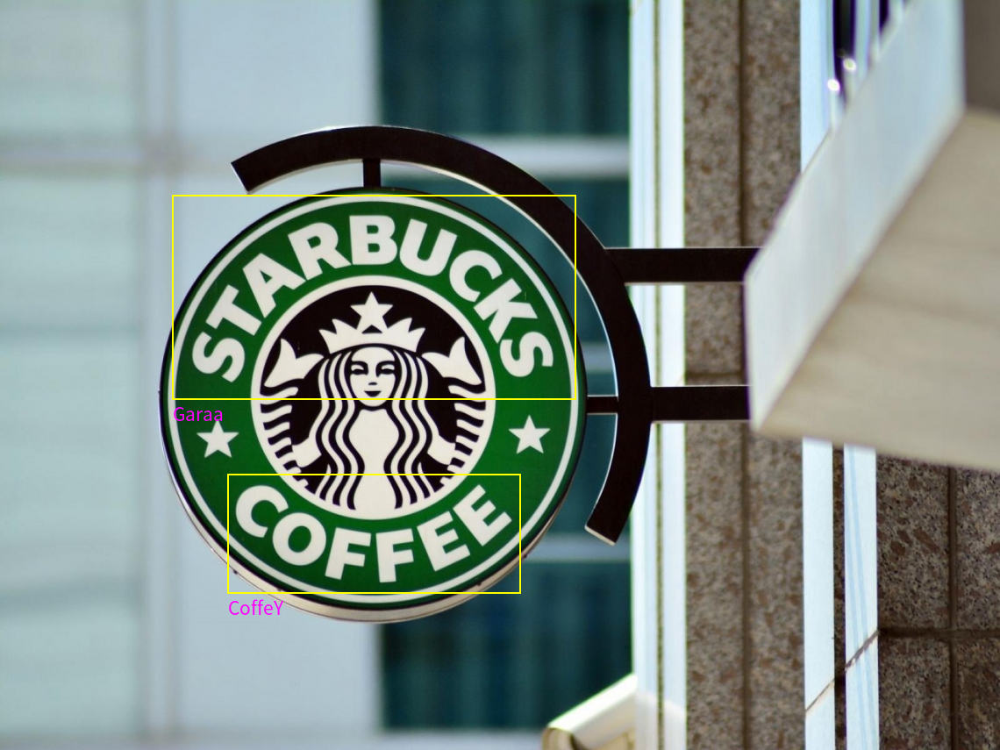

In [84]:
im = PIL.Image.open(imgpath)
draw_box_text(im, bounds)

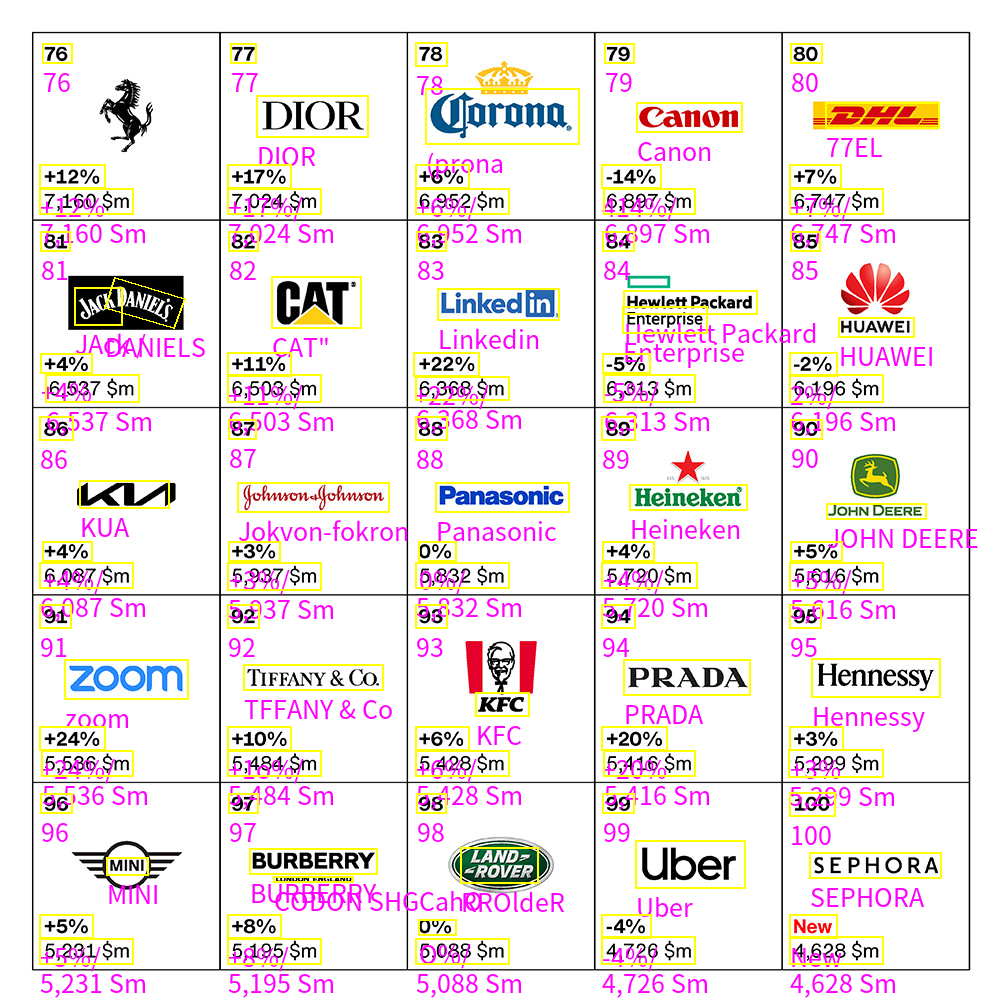

In [90]:
imgpath = "../testdata/logo2.jpg"
bounds = reader_e.readtext(imgpath)
#bounds
im = PIL.Image.open(imgpath)
#draw_box(im, bounds)
draw_box_text(im, bounds)

[([[493, 195], [539, 195], [539, 235], [493, 235]], 'L2', 0.10780845868993519), ([[33, 573], [75, 573], [75, 617], [33, 617]], '0m', 0.002246786770240434), ([[474, 280], [585, 280], [585, 725], [474, 725]], '', 0.0), ([[701, 587], [729, 587], [729, 603], [701, 603]], '[身', 0.019617807906862246), ([[706, 1032], [792, 1032], [792, 1060], [706, 1060]], '旬由時報', 0.05309874564409256), ([[467.82914291162353, 98.05725769856024], [600.7650684039223, 122.69780212941141], [578.1708570883765, 223.94274230143975], [445.23493159607773, 199.3021978705886]], '鍶', 0.05535551778451975), ([[72.71253537143728, 574.4275212228624], [268.67202964333705, 544.2189500254682], [274.2874646285627, 585.5724787771376], [78.32797035666293, 616.7810499745318]], '中國信託銀行', 0.9907304532967692), ([[-3.414213562373095, 596.5857864376269], [28.526772570738228, 590.7081155170677], [31.414213562373096, 609.4142135623731], [-0.5267725707382291, 615.2918844829323]], '34lk', 0.1491985023021698)]


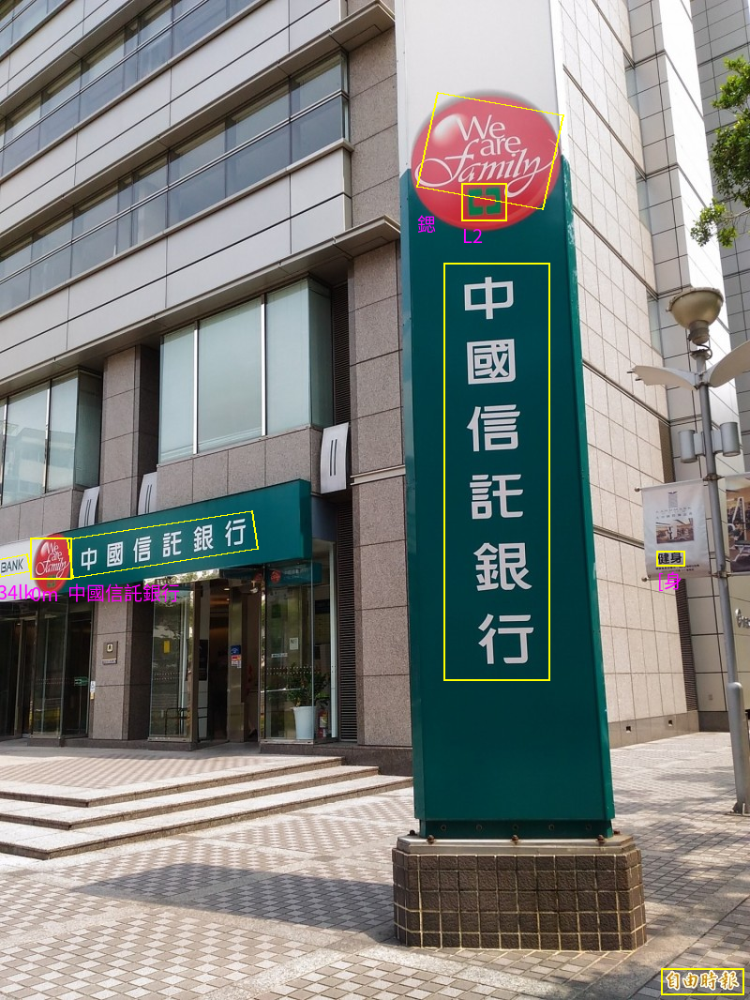

In [100]:
imgpath = "../testdata/ct1.jpg"
bounds = reader_ce.readtext(imgpath,text_threshold = 0.3)
print(bounds)
im = PIL.Image.open(imgpath)
draw_box_text(im, bounds)